# Double and Maybe Triple Pendulum
Caleb Richards: 4/19/2019


In [2]:
#here we import some of the relevant libraries and classes for use throughout this project

%matplotlib inline
import numpy as np
from scipy.integrate import odeint, solve_ivp
from numpy import linalg as linalg
import matplotlib.pyplot as plt
# The dpi (dots-per-inch) setting will affect the resolution and how large
#  the plots appear on screen and printed.  So you may want/need to adjust 
#  the figsize when creating the figure.
plt.rcParams['figure.dpi'] = 100.    # this is the default for notebook
from matplotlib import animation, rc
from IPython.display import HTML
# Change the common font size (smaller when higher dpi)
font_size = 10
plt.rcParams.update({'font.size': font_size})

# Double Pendulum Class and More Useful Functions

To tackle this problem, we will work with the Lagrangian Formalism, which means we will need to compute the kinetic and potential energies since $\mathcal{L} = T - V $

The potential energies are probably the easiest to figure out since the potential energy of a particle in linearized gravity is just mgh up to an arbitrary constant. So, we need to express the change in heights of the masses in terms of a set of generalized coordinates. $\phi_{1}$ and $\phi_{2}$ are the obvious choices since they are independent of each other and the entire configuration of the system can be described in terms of them.

So the potential energy of the first mass is just $-m_{1}gL_{1}cos{\phi_{1}}$ up to an additive constant and likewise that for the second mass is $-m_{2}gL_{2}cos{\phi_{2}} -m_{1}gL_{1}cos{\phi_{1}}$ so the the total potential energy V = $-m_{1}gL_{1}cos{\phi_{1}} -m_{2}gL_{2}cos{\phi_{2}}$ up to a constant.

To get the kinetic energy, the procedure slightly trickier. For mass 1, it is obviously just $\frac{1}{2}m_{1}L_{1}^{2}\dot{\phi_{1}}^{2}$. But for the second one, the velocity is not transparent just based off of inspection, so we will rather start from the corresponding position vector and start differentiating to figure this out. We write that $\vec{r_{2}} = \vec{r_{1}} + L_{2}\hat{e_{r}}$ where $\hat{e_{r}}$ is a unit vector along the length of the second rod. Taking a time derivative, we find that $\vec{v_{2}} = \vec{v_{1}} + L_{2}\dot{\phi_{2}}\hat{e_{\phi}}$ since the time derivative of $\hat{e_{r}}$ is $\dot{\phi_{2}}L_{2}\hat{e_{\phi}}$ where $\hat{e_{\phi}}$ is a unit vector perpendicular to the length of the rod and consistent with the right-hand rule. Then, we can resolve $\hat{e_{\phi}}$ into components parallel and perpendicular to the to the other rod to write the velocity in terms of an orthonormal basis set with unit vectors $\hat{e_l}$ and $\hat{e_\theta}$ with a rotation through the angle $\phi_{2}-\phi_{1}$. This results in a velocity for the second mass of $\vec{v_{2}} = L_{1}\dot{\phi_{1}}\hat{e_\theta} + L_{2}\dot{\phi_{2}}*[cos(\phi_{2}-\phi_{1})\hat{e_\theta}-sin(\phi_{2}-\phi_{1})\hat{e_l}]$. Squaring to get the energy, $KE = \frac{1}{2}m_{2}[L_1^2\dot{\phi_1}^2 + L_2^2\dot{\phi_2}^2 + 2L_1L_2\dot{\phi_1}\dot{\phi_2}cos(\phi_1-\phi_2)]$


Now, acknowledging that $\mathcal{L} = T - V$ and putting the pieces together, we find that

$\begin{align}
\mathcal{L} = \frac{1}{2}(m_1 + m_2)L_1^2\dot{\phi_1}^2 + \frac{1}{2}m_2L_2^2\dot{\phi_2}^2 + m_2L_1L_2\dot{\phi_1}\dot{\phi_2}cos(\phi_1 - \phi_2) + (m_1 + m_2)gL_1cos{\phi_1} + m_2gL_2cos{\phi_2}
\end{align}$

Applying the corresponding Euler-Lagrange Equations for each coordinate, we arrive at the equations of motion as:

$\begin{align}
(m_{1} + m_{2})L_{1}\ddot{\phi_{1}}+m_2L_2\ddot{\phi_2}cos(\phi_1 - \phi_2) + m_2L_1L_2\dot{\phi_1}^{2}sin(\phi_1 - \phi_2) +L_1g(m_1+m_2)sin(\phi_1) = 0\\
m_{2}L_{2}\ddot{\phi_2}+m_2L_1\ddot{\phi_1}cos(\phi_1-\phi_2)-m_2L_1\dot{\phi_1}^{2}sin(\phi_1-\phi_2)+m_{2}gsin(\phi_2)=0 \\
\end{align}$

In [3]:
class dubPend():
    """
    This class takes the properties passsed to it and uses them to 
    create a generic double pendulum using the equations of motion
    derived according the lagrangian formalism
    
    Parameters
    -------------
    L1: float
        lenght of top pend.
    L2: float
        lenght of bottom pend.
    g: float
        standard gravity acceleration
    w1: float
        natural frequency of top pendulum
    w2: float
        natural frequency of bottom pendulum
    m1: float
        mass of top pendulem
    m2: float
        mass of bottom pendulem
        
    Methods
    ----------
    dy_dt(t, y1, y2)
        Returns the right side of the system of first order differential equations 
        in vector format y, given time t and the corresponding values of y.
        
    solve_ode
        Solves the system of first order differential equations output by dy_dt in vector
        format through the solve_ivp ode solver 
    """
    def __init__(self, L1=1., L2=2., m1=1., m2=1., g=1.):
        self.L1 = L1
        self.L2 = L2
        self.g = g
        self.w1 = np.sqrt(g/L1)
        self.w2 = np.sqrt(g/L2)
        self.m1 = m1
        self.m2 = m2
        
    def dy_dt(self, t, y):
        """
        This function returns the right-hand side of the diffeq: 
        [eqn]
        
        Parameters
        ----------
        t : float
            time 
        y : float
            A 4-component vector with y[0] = phi1(t) and y[1] = dphi1/dt, 
            y[3] = phi2(t), y[4] = dphi2/dt
            
        Returns
        -------
        
        """
        #mass matrix analog calculates the entries and then populates as an np array
        M1 = (self.m1+self.m2)*self.L1
        M2 = (self.m1*self.L2)*np.cos(y[0]-y[2])
        M3 = self.m2*self.L1*np.cos(y[0]-y[2])
        M4 = self.m2*self.L2
        M = np.array([[M1, M2], [M3, M4]])
        
        #right-hand side of the vector differential equations derived above
        RH1 = -self.m2*self.L2*y[3]**2*np.sin(y[0]-y[2]) - self.g*(self.m1+self.m2)*np.sin(y[0])
        RH2 = self.m2*self.L1*y[1]**2*np.sin(y[0]-y[2]) - self.m2*self.g*np.sin(y[2])
        RH = np.array([[RH1],[RH2]])
        
        # Calculate the inerse of the mass matrix
        invM = linalg.inv(M)
        
        #multiply through by the inverse to leave the second order derivative terms
        theta_ddot = np.dot(invM,RH)
        
        #return the derivate of the state variable vector to be integrated by a solver
        vec = np.array([y[1], theta_ddot[0], y[3],theta_ddot[1]])
        return vec
        
    def solve_ode(self, t_pts, phi1_0, phi1_dot_0, phi2_0, phi2_dot_0,
                  abserr=1.0e-9, relerr=1.0e-9):
        """
        Solve the ODE given initial conditions.
        Specify smaller abserr and relerr to get more precision.
        """
        y = [phi1_0, phi1_dot_0,phi2_0, phi2_dot_0] 
        solution = solve_ivp(self.dy_dt, (t_pts[0], t_pts[-1]), 
                             y, t_eval=t_pts, 
                             atol=abserr, rtol=relerr)
        
        #encode the order of the 4 variables that will be returned
        phi1, phi1_dot,phi2, phi2_dot = solution.y

        return phi1, phi1_dot,phi2, phi2_dot

In [54]:
#the same plotting function we developed in the course
def plot_y_vs_x(x, y, axis_labels=None, label=None, title=None, 
                color=None, linestyle=None, semilogy=False, loglog=False,
                ax=None):
    """
    Generic plotting function: return a figure axis with a plot of y vs. x,
    with line color and style, title, axis labels, and line label
    """
    if ax is None:        # if the axis object doesn't exist, make one
        ax = plt.gca()

    if (semilogy):
        line, = ax.semilogy(x, y, label=label, 
                            color=color, linestyle=linestyle)
    elif (loglog):
        line, = ax.loglog(x, y, label=label, 
                          color=color, linestyle=linestyle)
    else:
        line, = ax.plot(x, y, label=label, 
                    color=color, linestyle=linestyle)

    if label is not None:    # if a label if passed, show the legend
        ax.legend()
    if title is not None:    # set a title if one if passed
        ax.set_title(title)
    if axis_labels is not None:  # set x-axis and y-axis labels if passed  
        ax.set_xlabel(axis_labels[0])
        ax.set_ylabel(axis_labels[1])

    return ax, line

In [5]:
#returns the indices of a specified value in the array
def start_stop_indices(t_pts, plot_start, plot_stop):
    start_index = (np.fabs(t_pts-plot_start)).argmin()  # index in t_pts array 
    stop_index = (np.fabs(t_pts-plot_stop)).argmin()  # index in t_pts array 
    return start_index, stop_index

# Analysis

Now we want to make plots of the pendulum in action and in particular show the chaotic nature of its motion give suitably large initial conditions. First we made plots of the 2 angles as a function of time, and also of the angular velocities with respect to time. However, one useful way to see a signature of chaos is to look at the so called state-space plot which plots each angle with its corresponding angular velocity. If the state space does not close on itself and looks very messy and disorganized in general (which it does !), then we have a good clue that the system is chaotic! 

To get see chaos even more clearly, we look at the response of the system to slightly varied sets of initial conditions, ie. we will run this once to get nice time-response plots with both angles being essentially $\pi$ and then run it again with these being perturbed slightly, and plot the time evolution of the difference in the responses on a semi-log plot. If the solutions diverge exponentially, then we will have a good idea that the system is chaotic! 

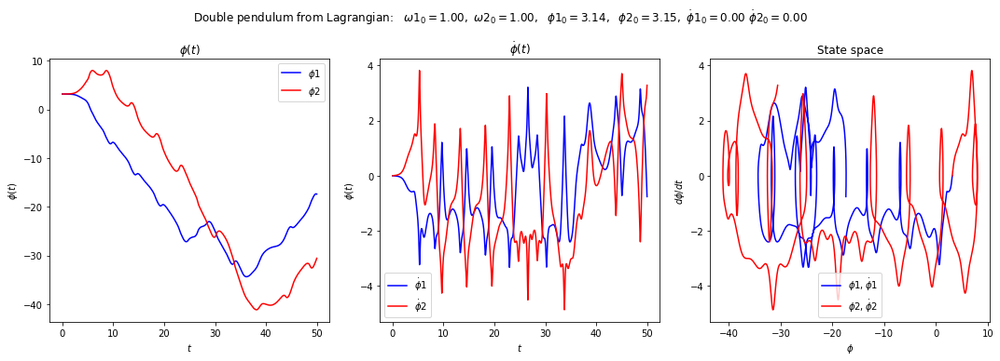

In [80]:
# Labels for individual plot axes
phi_vs_time_labels = (r'$t$', r'$\phi(t)$')
phi_dot_vs_time_labels = (r'$t$', r'$d\phi/dt(t)$')
state_space_labels = (r'$\phi$', r'$d\phi/dt$')

# Common plotting time (generate the full time then use slices)
t_start = 0.
t_end = 1000.
delta_t = 0.01

t_pts = np.arange(t_start, t_end+delta_t, delta_t)  


#set up the parameters that we will pass to the double pendulum class
L1 = 1.
L2 = 1.
m1 = 1.
m2 = 1.
g = 1.
mass = 1.

#instantiate a double pendulum
P12 = dubPend(L1=L1, L2=L2, m1 = m1, m2 = m2, g=g)


#enter initial conditions to pass the solver
eps = 0.01    #a small perturbation parameter that we will use to vary IC's by a small amount
phi1_0 = np.pi
phi1_dot_0 = 0.
phi2_0 = np.pi + eps
phi2_dot_0 = 0.


#solve the equations of motion!!
phi1, phi1_dot, phi2, phi2_dot = P12.solve_ode(t_pts, phi1_0, phi1_dot_0, phi2_0, phi2_dot_0)
phivec = np.array([phi1, phi2])


# start the plot!
fig = plt.figure(figsize=(15,5))
overall_title = 'Double pendulum from Lagrangian:  ' + \
                rf' $\omega1_{0} = {P12.w1:.2f},$' + \
                rf' $\omega2_{0} = {P12.w2:.2f},$' + \
                rf'  $\phi1_0 = {phi1_0:.2f},$' + \
                rf'  $\phi2_0 = {phi2_0:.2f},$' + \
                rf' $\dot\phi1_0 = {phi1_dot_0:.2f}$' + \
                rf' $\dot\phi2_0 = {phi2_dot_0:.2f}$' + \
                '\n'     # \n means a new line (adds some space here)
fig.suptitle(overall_title, va='baseline')


# first plot: phi 1 and 2 plot 
ax_a = fig.add_subplot(1,3,1)                  

start, stop = start_stop_indices(t_pts, t_start, 50)    
plot_y_vs_x(t_pts[start : stop], phi1[start : stop], 
            axis_labels=phi_vs_time_labels, 
            color='blue',
            label=rf'$\phi1$', 
            title=r'$\phi(t)$', 
            ax=ax_a)    
plot_y_vs_x(t_pts[start : stop], phi2[start : stop], color = 'red', 
            label = rf'$\phi2$',
            ax = ax_a)

# second plot: phi_dot 1 and 2 plot 
ax_b = fig.add_subplot(1,3,2)                  

  
plot_y_vs_x(t_pts[start : stop], phi1_dot[start : stop], 
            axis_labels=phi_vs_time_labels, 
            color='blue',
            label=r'$\dot\phi1$', 
            title=r'$\dot\phi(t)$', 
            ax=ax_b)
plot_y_vs_x(t_pts[start : stop], phi2_dot[start : stop], color ='red', 
            label=r'$\dot\phi2$', 
            ax = ax_b)


# third plot: state space plot from t=30 to t=50  for 1 and two 
ax_c = fig.add_subplot(1,3,3)                  

  
plot_y_vs_x(phi1[start : stop], phi1_dot[start : stop], 
            axis_labels=state_space_labels, 
            color='blue',
            label=r'$\phi1, \dot\phi1$',
            title='State space', 
            ax=ax_c)    
plot_y_vs_x(phi2[start : stop], phi2_dot[start : stop], color = 'red', 
            label=r'$\phi2, \dot\phi2$',
            ax=ax_c)

fig.tight_layout()
fig.savefig('double_pendulum_Lagrange.png', bbox_inches='tight')  

(<matplotlib.axes._subplots.AxesSubplot at 0x14263512198>,
 <matplotlib.lines.Line2D at 0x142003bbc50>)

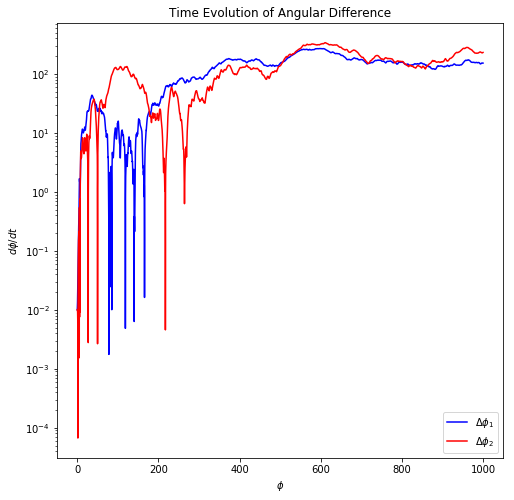

In [81]:
# Re-run with perturbed IC's to see how the difference evolves

phi1_0_perturbed = phi1_0 + eps
phi2_0_perturbed = phi2_0 +eps

#solve the equations of motion!!
phi1_pert, phi1_dot_pert, phi2_pert, phi2_dot_pert = P12.solve_ode(t_pts, phi1_0_perturbed, 
                                                                   phi1_dot_0, phi2_0_perturbed, phi2_dot_0)
delta_phi1 = abs(phi1_pert - phi1)
delta_phi2 = abs(phi2_pert - phi2)

fig2 = plt.figure(figsize = (8,8))
chaosplot = fig2.add_subplot(1,1,1)
plot_y_vs_x( t_pts, delta_phi1, 
            semilogy = 'true',
            axis_labels=state_space_labels, 
            color='blue',
            label=r'$\Delta\phi_1$',
            title='Time Evolution of Angular Difference', 
            ax=chaosplot)    

plot_y_vs_x(t_pts, delta_phi2,
            semilogy = 'true',
            color = 'red', 
            label=r'$\Delta\phi_{2}$',
            ax=chaosplot)

# Animation!

Now we will animate the system and hopefully visualize and confirm the results of previously. In fact, we will animate two pendulums with slightly different IC's and see precisely how the motions diverge. To keep the size of the animation reasonable, we will restrict the run time to be no more than 10 seconds.

In [105]:
%%capture

fig_anim = plt.figure(figsize=(4,4), num='Double Pendulum')
ax_anim = fig_anim.add_subplot(1,1,1)
gap1 = L1/7
gap2 = L2/7
ax_anim.set_xlim(-(L1+L2+gap2), L1+L2+gap2)
ax_anim.set_ylim(-(L1+L2+gap2), L1+L2+gap2)
ax_anim.set_aspect('equal')
ax_anim.set_axis_off()

line_anim, = ax_anim.plot([],[], lw=2)
line_anim2, = ax_anim.plot([],[], lw=2)

bob1 = plt.Circle((0,0), radius = gap1, fc = 'b')
bob2 = plt.Circle((0,0), radius = gap2, fc = 'k')
bob3 = plt.Circle((0,0), radius = gap1, fc = 'b')
bob4 = plt.Circle((0,0), radius = gap2, fc = 'k')
ax_anim.add_patch(bob1)
ax_anim.add_patch(bob2)
ax_anim.add_patch(bob3)
ax_anim.add_patch(bob4)
fig_anim.tight_layout()

In [106]:
def coord_transform(phi1, phi2, phi1_p, phi2_p, L1, L2):
    """Takes the angular outputs of the solution and converts to the respective 
    cartesian coordinates with the fixed pivot at the origin for use in plotting
    """
    x1 = L1*np.sin(phi1)
    y1 = -L1*np.cos(phi1)
    x2 = x1 + L2*np.sin(phi2)
    y2 = y1 - L2*np.cos(phi2)
    
    x3 = L1*np.sin(phi1_p)
    y3 = -L1*np.cos(phi1_p)
    x4 = x3 + L2*np.sin(phi2_p)
    y4 = y3 - L2*np.cos(phi2_p)
    
    x1pts = np.linspace(0,x1,4)
    y1pts = np.linspace(0,y1,4)
    x2pts = np.linspace(x1,x2,4)
    y2pts = np.linspace(y1,y2,4)
    
    x3pts = np.linspace(0,x3,4)
    y3pts = np.linspace(0,y3,4)
    x4pts = np.linspace(x3,x4,4)
    y4pts = np.linspace(y3,y4,4)
    
    
    return [x1pts, x2pts], [y1pts, y2pts], [x3pts, x4pts], [y3pts,y4pts],[x1,y1],[x2,y2], [x3,y3],[x4,y4]

In [107]:
def animate_pend(i):
    """This is the function called by FuncAnimation to create each frame,
        numbered by i.  So each i corresponds to a point in the t_pts
        array, with index i.
    """
    t = t_pts[i]
    data1, data2, data3, data4, center1, center2, center3, center4 = coord_transform(phi1[i], phi2[i], phi1_pert[i],
                                                                                     phi2_pert[i], L1, L2)
    
    bob1.center = (center1)
    bob2.center = (center2)
    bob3.center = (center3)
    bob4.center = (center4)
    line_anim.set_data(data1, data2)  # overwrite line_anim with new points
    line_anim2.set_data(data3, data4)
    return (line_anim, line_anim2, bob1,bob2, bob3, bob4,)   # this is needed for blit=True to work



In [108]:
frame_interval = 0.2  # time between frames

#limit to twenty seconds by creating truncating the array of time points
start, stop = start_stop_indices(t_pts, t_start, t_start+20)
new_t_pts = t_pts[start : stop]
frame_number = np.size(new_t_pts)    # number of frames to include (index of t_pts)
anim = animation.FuncAnimation(fig_anim, 
                               animate_pend, 
                               init_func=None,
                               frames=frame_number, 
                               interval=frame_interval, 
                               blit=True,
                               repeat=False)

#fig.show()

In [109]:
plt.rcParams['animation.embed_limit']=60
HTML(anim.to_jshtml())